In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
# from keras.backend.tensorflow_backend import set_session
import sys, time, os, warnings 
import numpy as np
import pandas as pd 
from collections import Counter 
# warnings.filterwarnings("ignore")
# print("python {}".format(sys.version))
# print("keras version {}".format(keras.__version__)); del keras
# print("tensorflow version {}".format(tf.__version__))
# config = tf.ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.5
# config.gpu_options.visible_device_list = "4"
# set_session(tf.Session(config=config))

tf.compat.v1.disable_eager_execution()

In [2]:
import numpy as np
w1, b1 = np.array([3,7]).reshape(1,2), np.array([5,1]).reshape(2)
w2, b2 = np.array([-10,10]).reshape(2,1), np.array([11]).reshape(1)
print("w1={},\nb1={},\nw2={},\nb2={}".format(w1,b1,w2,b2))
weights = ((w1,b1), (w2,b2))

w1=[[3 7]],
b1=[5 1],
w2=[[-10]
 [ 10]],
b2=[11]


In [3]:
def relu(x):
    x[ x < 0 ] = 0
    return(x)
def NN2layer_dropout(x,weights,p_dropout=0.1):
    ## rate: float between 0 and 1. Fraction of the input units to drop. 
    
    (w1,b1), (w2,b2) = weights
    ## dropout
    keep_prob = 1 - p_dropout
    Nh1 = w2.shape[0]
    Ikeep = np.random.binomial(1,keep_prob,size=Nh1)
    I = np.zeros((1,Nh1))
    I[:,Ikeep==1] = 1/keep_prob
    
    ## 2-layer NN with Dropout
    h1 = relu(np.dot(x,w1) + b1)
    y = np.dot(h1*I,w2) + b2
    return(y[0,0])

In [4]:
x = np.array([2]).reshape(1,1)

OrderedDict([(-355.66666666666663, 197), (11.0, 495), (144.33333333333331, 89), (510.99999999999994, 219)])
1000 Dropout outputs from hand-made NN
 -355.67:  0.20%
   11.00:  0.49%
  144.33:  0.09%
  511.00:  0.22%


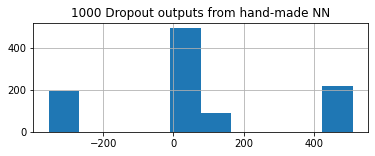

In [5]:
from collections import Counter, OrderedDict

def plot_histogram(ys, ax, title=""):    
    counter = Counter(ys)
    counter = OrderedDict(sorted(counter.items()))
    print(counter)
    # probs = np.array(counter.values())*100.0/np.sum(counter.values())
    probs = list(counter.values())*100/np.sum(list(counter.values()))
    keys = list(counter.keys())
    print(title)
    for k,p in zip(keys,probs):
        print("{:8.2f}: {:5.2f}%".format(k,p))
    n, bins, rect = ax.hist(ys)
    ax.set_title(title)
    ax.grid(True)

Nsim = 1000
p_dropout = 0.7
ys_handmade = []
for _ in range(Nsim):
    ys_handmade.append(NN2layer_dropout(x,weights,p_dropout))
    
fig = plt.figure(figsize=(6,2))
ax = fig.add_subplot(1,1,1)
plot_histogram(ys_handmade, ax, 
               "1000 Dropout outputs from hand-made NN")
plt.show()

In [6]:
Nsim = 1000
p_dropout = 0.7
ys_handmade = []
for _ in range(Nsim):
    ys_handmade.append(NN2layer_dropout(x,weights,p_dropout))

counter = Counter(ys_handmade)
counter = OrderedDict(sorted(counter.items()))


print(counter.values())
print(np.array(counter.values()))
print(np.sum(counter.values()))

print(np.sum(list(counter.values())))

print(np.array(counter.keys()))

odict_values([207, 476, 106, 211])
odict_values([207, 476, 106, 211])
odict_values([207, 476, 106, 211])
1000
odict_keys([-355.66666666666663, 11.0, 144.33333333333331, 510.99999999999994])


In [7]:
import keras.backend as K
from keras.models import Model
from keras.layers import Input, Dense,Dropout

Nfeat = 1 
tinput = Input(shape=(Nfeat,), name="ts_input")
h = Dense(2, activation='relu',name="dense1")(tinput)
hout = Dropout(p_dropout)(h)
out = Dense(1, activation="linear",name="dense2")(hout)

model = Model(inputs=[tinput], outputs=out)

model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ts_input (InputLayer)        [(None, 1)]               0         
_________________________________________________________________
dense1 (Dense)               (None, 2)                 4         
_________________________________________________________________
dropout (Dropout)            (None, 2)                 0         
_________________________________________________________________
dense2 (Dense)               (None, 1)                 3         
Total params: 7
Trainable params: 7
Non-trainable params: 0
_________________________________________________________________


In [8]:
for layer in model.layers:
    if layer.name == "dense1":
        layer.set_weights((w1,b1))
    if layer.name == "dense2":
        layer.set_weights((w2,b2))

In [9]:
class KerasDropoutPrediction(object):
    def __init__(self,model):
        self.f = K.function(
                [model.layers[0].input, 
                 K.learning_phase()],
                [model.layers[-1].output])
    def predict(self,x, n_iter=10):
        result = []
        for _ in range(n_iter):
            result.append(self.f([x , 1]))
        result = np.array(result).reshape(n_iter,len(x)).T
        return result

In [10]:
kdp = KerasDropoutPrediction(model)
result = kdp.predict(x,Nsim)
ys_keras = result.flatten()

OrderedDict([(-355.66666666666663, 207), (11.0, 476), (144.33333333333331, 106), (510.99999999999994, 211)])
1000 Dropout outputs from hand-made NN
 -355.67:  0.21%
   11.00:  0.48%
  144.33:  0.11%
  511.00:  0.21%
OrderedDict([(-355.66663, 207), (11.0, 505), (144.33337, 65), (511.0, 223)])
1000 Dropout outputs from Keras's NN
 -355.67:  0.21%
   11.00:  0.51%
  144.33:  0.07%
  511.00:  0.22%


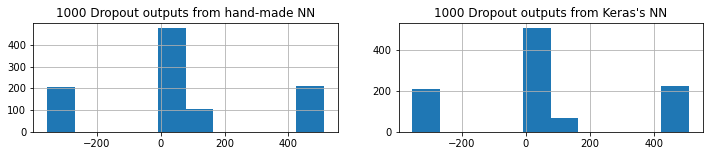

In [11]:
fig = plt.figure(figsize=(12,2))
ax = fig.add_subplot(1,2,1)
plot_histogram(ys_handmade, ax, 
               "1000 Dropout outputs from hand-made NN")
ax = fig.add_subplot(1,2,2)
plot_histogram(ys_keras, ax, 
               "1000 Dropout outputs from Keras's NN")
plt.show()

In [12]:
import random, math
## Define x
inc = 0.001
x_train =np.concatenate([np.arange(-2,-1.5,inc),np.arange(-1,0.5,inc)])
x_train = x_train.reshape(len(x_train),1)

## Define y 
steps_per_cycle = 1
def sinfun(xs,noise=0):
    xs = xs.flatten()
    def randomNoise(x):
        wnoise = random.uniform(-noise, noise)
        return(math.sin(x * (2 * math.pi / steps_per_cycle) ) + wnoise)
    vec = [randomNoise(x) - x  for x in xs]
    return(np.array(vec).flatten())

y_train0 =  sinfun(x_train) 
y_train = y_train0.reshape(len(y_train0),1)


print(" x_train.shape={}".format(x_train.shape))
print(" y_train.shape={}".format(y_train.shape))

 x_train.shape=(2000, 1)
 y_train.shape=(2000, 1)


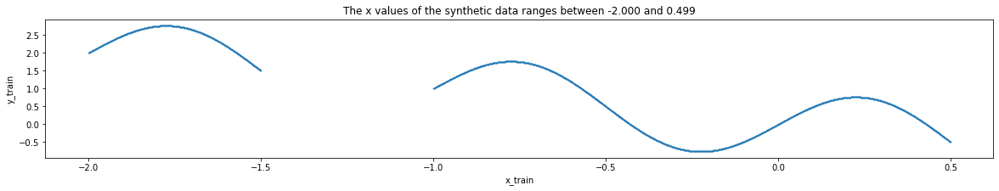

In [13]:
plt.figure(figsize=(20,3))
plt.scatter(x_train.flatten(),y_train.flatten(),s=0.5)
plt.xlabel("x_train")
plt.ylabel("y_train")
plt.title("The x values of the synthetic data ranges between {:4.3f} and {:4.3f}".format(
    np.min(x_train),np.max(x_train)))
plt.show()

In [14]:
from keras.models import Model
from keras.layers import Input, Dense,Dropout
from keras import optimizers

def define_model(rate_dropout=0.5,
                 activation="relu",
                 dropout_all_hlayers=True):
    tinput = Input(shape=(1,), name="ts_input")
    Nhlayer = 4
    network = tinput
    for i in range(Nhlayer):
        network = Dense(1024, activation=activation)(network)
        if dropout_all_hlayers or i == (Nhlayer - 1):
            network = Dropout(rate_dropout)(network)
    out = Dense(1, activation="linear")(network)

    model = Model(inputs=[tinput], outputs=out)
    model.compile(loss="mean_squared_error",
                  optimizer=optimizers.Adam(lr=0.0001))#0.0005
    return(model)


model1 = define_model()
model1.summary()
hist = model1.fit(x_train,
                 y_train,
                 batch_size=len(x_train),
                 verbose=1,
                 epochs=50)

s/sample - loss: 0.1582
Epoch 274/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1540
Epoch 275/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1564
Epoch 276/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1560
Epoch 277/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1530
Epoch 278/500
2000/2000 [==============================] - 0s 1us/sample - loss: 0.1510
Epoch 279/500
2000/2000 [==============================] - 0s 1us/sample - loss: 0.1515
Epoch 280/500
2000/2000 [==============================] - 0s 1us/sample - loss: 0.1509
Epoch 281/500
2000/2000 [==============================] - 0s 1us/sample - loss: 0.1514
Epoch 282/500
2000/2000 [==============================] - 0s 1us/sample - loss: 0.1506
Epoch 283/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1504
Epoch 284/500
2000/2000 [==============================] - 0s 0us/sample - loss: 0.1454
Epoch 28

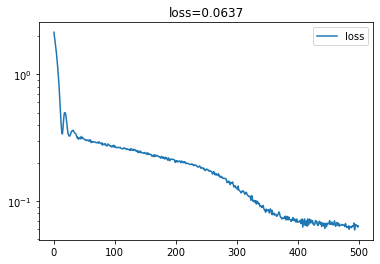

In [15]:
for key in hist.history.keys():
    plt.plot(hist.history[key],label=key)
plt.title("loss={:5.4f}".format(hist.history["loss"][-1]))
plt.legend()
plt.yscale('log')
plt.show()

In [16]:
maxx = np.max(x_train)
x_test = np.arange(-2,3 ,inc).reshape(-1,1)
print("x_train -- Min:{:4.3f} Max:{:4.3f}".format(np.min(x_train),maxx))
print("x_test  -- Min:{:4.3f} Max:{:4.3f}".format(np.min(x_test),np.max(x_test)))

x_train -- Min:-2.000 Max:0.499
x_test  -- Min:-2.000 Max:2.999


In [17]:
kdp = KerasDropoutPrediction(model1)
y_pred_do = kdp.predict(x_test,n_iter=100)
y_pred_do_mean = y_pred_do.mean(axis=1)

In [18]:
y_pred = model1.predict(x_test) 

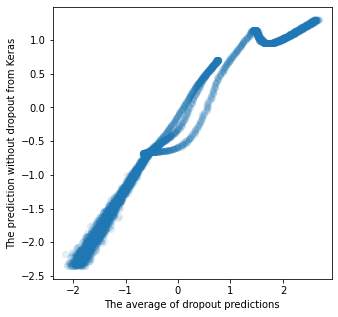

In [19]:
plt.figure(figsize=(5,5))
plt.scatter(y_pred_do_mean , y_pred, alpha=0.1)
plt.xlabel("The average of dropout predictions")
plt.ylabel("The prediction without dropout from Keras")
plt.show()

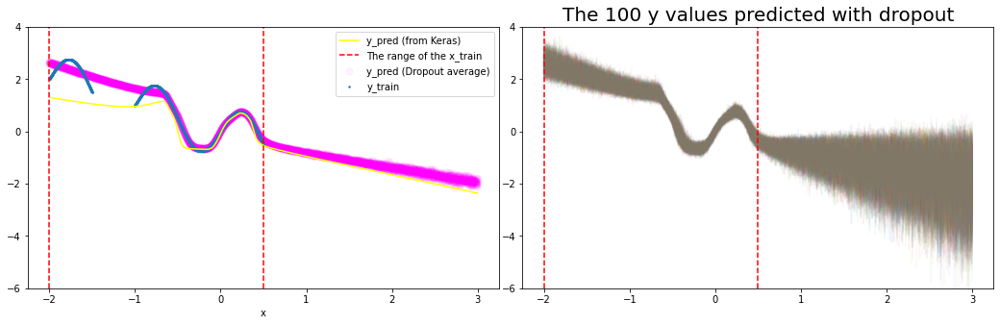

In [20]:
def vertical_line_trainin_range(ax):
    minx, maxx = np.min(x_train), np.max(x_train)
    ax.axvline(maxx,c="red",ls="--")
    ax.axvline(minx,c="red",ls="--",
               label="The range of the x_train")

def plot_y_pred_do(ax,y_pred_do, 
                   fontsize=20,
                   alpha=0.05,
                   title="The 100 y values predicted with dropout"):
    for iiter in range(y_pred_do.shape[1]):
        ax.plot(x_test,y_pred_do[:,iiter],label="y_pred (Dropout)",alpha=alpha)
    ax.set_ylim(*ylim)
    vertical_line_trainin_range(ax)
    ax.set_title(title,fontsize= fontsize)

    
ylim = (-6,4)        
fig = plt.figure(figsize=(18,5))
fig.subplots_adjust( hspace = 0.13 , wspace = 0.05)

ax = fig.add_subplot(1,2,1)
ax.plot(x_test,y_pred,  
        color="yellow",
        label = "y_pred (from Keras)")
ax.scatter(x_test,y_pred_do_mean, 
           s=50,alpha=0.05,
           color="magenta",
           label = "y_pred (Dropout average)")
ax.scatter(x_train,y_train,s=2,label = "y_train")
ax.set_ylim(*ylim)
ax.set_xlabel("x")
vertical_line_trainin_range(ax)
ax.legend()

ax = fig.add_subplot(1,2,2)
plot_y_pred_do(ax,y_pred_do)
plt.show()